In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from math import ceil

In [3]:
# Load the data
datos = pd.read_csv("/home/thermostatic/Desktop/Uni code/Ratas/datos/Sanas/S3/S3s1DV100.csv", skiprows=12)

steps = 100
# Create a list of dataframes, each with 300 rows
datos_list = [datos.iloc[i:i+steps] for i in range(0, len(datos), steps)]
datos

,Sample no.,Time,X,Y,Aceleration,Distance,Consecuences,Unnamed: 7,Unnamed: 8,Xj-i,Yj-i,Unnamed: 11
0,0,0.000,53.919694,5.534351,0.000,0.000,0,2,A1,0.000000,-0.190840,0.0
1,1,0.647,53.919694,5.343511,0.000,0.250,0,2,A2,0.191205,-0.381679,NaN
2,2,0.825,54.110899,4.961832,0.014,0.559,0,2,A3,2.868069,0.000000,NaN
3,3,0.993,56.978968,4.961832,0.033,3.750,0,2,A4,1.720841,0.190840,NaN
4,4,1.157,58.699809,5.152672,0.228,2.264,0,2,A5,0.000000,1.335878,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
7275,7275,1199.201,97.131931,8.396947,0.015,0.500,0,2,NaN,NaN,NaN,NaN
7276,7276,1199.367,97.131931,8.587786,0.030,0.250,0,2,NaN,NaN,NaN,NaN
7277,7277,1199.530,97.131931,8.587786,0.015,0.000,0,2,NaN,NaN,NaN,NaN
7278,7278,1199.695,97.131931,8.587786,0.000,0.000,0,2,NaN,NaN,NaN,NaN


In [4]:
def obtain_kinetic_data(datos):
    # Calculate time differences
    time_diff = np.diff(datos["Time"])
    # Calculate position differences
    displacement_x = np.diff(datos["X"])
    displacement_y = np.diff(datos["Y"])

    # Calculate velocity using finite difference method
    velocity_x = displacement_x / time_diff
    velocity_y = displacement_y / time_diff

    # Calculate acceleration using finite difference method
    acceleration_x = np.diff(velocity_x) / time_diff[:-1]
    acceleration_y = np.diff(velocity_y) / time_diff[:-1]
    
    return (time_diff, datos["X"], datos["Y"], displacement_x, displacement_y,
            velocity_x, velocity_y, acceleration_x, acceleration_y)

def obtain_speed(velocity_x, velocity_y):
    # Calculate speed
    speed = np.sqrt(velocity_x**2 + velocity_y**2)

    # Add a zero at the end to match the length of the position data
    speed = np.append(speed, 0)
    
    return speed

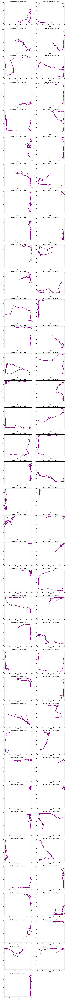

In [5]:
# Plot the vector field with position given by X and Y
plt.figure(figsize=(10, 4*ceil(len(datos_list)/2)))

for i in range(len(datos_list)):
    time_diff, position_x, position_y, displacement_x, displacement_y, velocity_x, velocity_y, acceleration_x, acceleration_y = obtain_kinetic_data(datos_list[i])
    plt.subplot(ceil(len(datos_list)/2), 2, i+1)
    plt.quiver(position_x[:-1], position_y[:-1], displacement_x, displacement_y, 
           color='purple')
    plt.xlabel('X (cm)')
    plt.ylabel('Y (cm)')
    plt.xlim(0, 100)
    plt.ylim(0, 100)
    plt.title(f'Displacement {i+1} Vector Field')
    
plt.tight_layout()

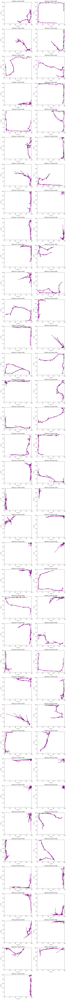

In [6]:
# Plot the vector field with position given by X and Y
plt.figure(figsize=(10, 4*ceil(len(datos_list)/2)))

for i in range(len(datos_list)):
    time_diff, position_x, position_y, displacement_x, displacement_y, velocity_x, velocity_y, acceleration_x, acceleration_y = obtain_kinetic_data(datos_list[i])
    plt.subplot(ceil(len(datos_list)/2), 2, i+1)
    plt.quiver(position_x[:-1], position_y[:-1], velocity_x, velocity_y, 
           color='purple')
    plt.xlabel('X (cm)')
    plt.ylabel('Y (cm)')
    plt.xlim(0, 100)
    plt.ylim(0, 100)
    plt.title(f'Velocity {i+1} Vector Field')
    
plt.tight_layout()

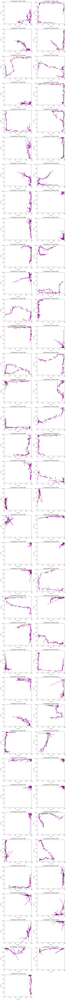

In [7]:
# Plot the vector field with position given by X and Y
plt.figure(figsize=(10, 4*ceil(len(datos_list)/2)))

for i in range(len(datos_list)):
    time_diff, position_x, position_y, displacement_x, displacement_y, velocity_x, velocity_y, acceleration_x, acceleration_y = obtain_kinetic_data(datos_list[i])
    plt.subplot(ceil(len(datos_list)/2), 2, i+1)
    plt.quiver(position_x[:-2], position_y[:-2], acceleration_x, acceleration_y, 
           color='purple')
    plt.xlabel('X (cm)')
    plt.ylabel('Y (cm)')
    plt.xlim(0, 100)
    plt.ylim(0, 100)
    plt.title(f'Acceleration {i+1} Vector Field')
    
plt.tight_layout()

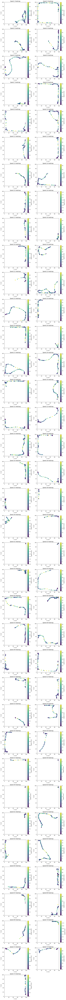

In [8]:
# Plot the vector field with position given by X and Y
plt.figure(figsize=(10, 4*ceil(len(datos_list)/2)))

for i in range(len(datos_list)):
    time_diff, position_x, position_y, displacement_x, displacement_y, velocity_x, velocity_y, acceleration_x, acceleration_y = obtain_kinetic_data(datos_list[i])
    plt.subplot(ceil(len(datos_list)/2), 2, i+1)
    
    speed = obtain_speed(velocity_x, velocity_y)
    plt.scatter(position_x, position_y, c=speed, cmap='viridis')
    plt.xlabel('X (cm)')
    plt.ylabel('Y (cm)')
    plt.xlim(0, 100)
    plt.ylim(0, 100)
    plt.title(f'Speed {i+1} Heatmap')
    plt.colorbar(label='Speed (cm/s)')
    
    
plt.tight_layout()

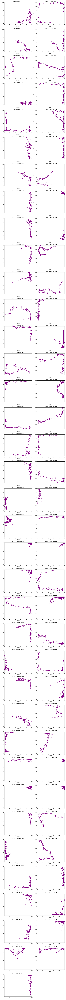

In [9]:
# Assume a mass of 0.25 kg for the rat
mass = 250

# Plot the vector field with position given by X and Y
plt.figure(figsize=(10, 4*ceil(len(datos_list)/2)))

works = []

for i in range(len(datos_list)):
    time_diff, position_x, position_y, displacement_x, displacement_y, velocity_x, velocity_y, acceleration_x, acceleration_y = obtain_kinetic_data(datos_list[i])
    plt.subplot(ceil(len(datos_list)/2), 2, i+1)
    # Calculate the force in the x and y directions
    force_x = mass * acceleration_x
    force_y = mass * acceleration_y
    
    # Calculate work done
    work_x = force_x * displacement_x[:-1]
    work_y = force_y * displacement_y[:-1]

    work_total = np.sum(work_x) + np.sum(work_y)
    
    works.append(work_total)
    
    plt.quiver(position_x[:-2], position_y[:-2], force_x, force_y, 
           color='purple')
    plt.xlabel('X (cm)')
    plt.ylabel('Y (cm)')
    plt.xlim(0, 100)
    plt.ylim(0, 100)
    plt.title(f'Force {i+1} Vector Field')
    
plt.tight_layout()

In [11]:
works

[-1677955.548464546,
 -2267852.2033464713,
 -784627.250440726,
 -1531530.0990086198,
 -1587795.105507872,
 -2031223.9760456337,
 -278792.7640999293,
 -1456448.7311715689,
 -2522804.5999981645,
 -2210801.273232816,
 -1151511.5949526955,
 -1887374.021364842,
 -641099.8436893537,
 -1168307.9513361354,
 -1099714.9615355025,
 -40586.92602631091,
 -825890.3914063415,
 -419970.65573227924,
 -519213.8560852931,
 -1172136.0551303863,
 -1773025.0954961735,
 -1590318.5435368386,
 -1973732.04563855,
 -957880.4528316795,
 -1150804.6901265336,
 -512022.5448861816,
 -1798627.3059416525,
 -1659109.3293903037,
 -1281559.993276488,
 -979590.8823590134,
 -1307328.593791637,
 -1397755.4714185428,
 -1098423.980421442,
 -1910772.4557614108,
 -1031864.8702689144,
 -1209902.78214357,
 -1120058.301417495,
 -499064.705297813,
 -760915.6896875144,
 -666474.6656991777,
 -25126.48795849864,
 -150303.8373315987,
 -725849.4735194863,
 -1821472.395243845,
 -1497815.6108893147,
 -2002918.2581611339,
 -949683.025329317

In [13]:
f"{np.sum(works):,.0f}"

'-85,746,617'